In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import train_test_split
#from pandas_profiling import ProfileReport
import tensorflow as tf
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report,roc_auc_score,precision_score,recall_score,f1_score
%matplotlib inline
from sklearn.neural_network import MLPClassifier

In [2]:
dataset = pd.read_excel("D:/PhD/Deep Learning/Dry_Bean_Dataset/Dry_Bean_Dataset.xlsx")

In [3]:
dataset.head()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER


In [4]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

In [5]:
dataset.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703
50%,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386
75%,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883
max,254616.000000,1985.370000,738.860153,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


In [6]:
dataset.shape

(13611, 17)

In [7]:
dataset.isnull().sum()

Area               0
Perimeter          0
MajorAxisLength    0
MinorAxisLength    0
AspectRation       0
Eccentricity       0
ConvexArea         0
EquivDiameter      0
Extent             0
Solidity           0
roundness          0
Compactness        0
ShapeFactor1       0
ShapeFactor2       0
ShapeFactor3       0
ShapeFactor4       0
Class              0
dtype: int64

In [8]:
dataset.duplicated().sum()

68

In [9]:
dataset.drop_duplicates(inplace=True)

In [10]:
dataset.duplicated().sum()

0

In [11]:
dataset.shape

(13543, 17)

In [12]:
dataset['Class'].value_counts()

Class
DERMASON    3546
SIRA        2636
SEKER       2027
HOROZ       1860
CALI        1630
BARBUNYA    1322
BOMBAY       522
Name: count, dtype: int64

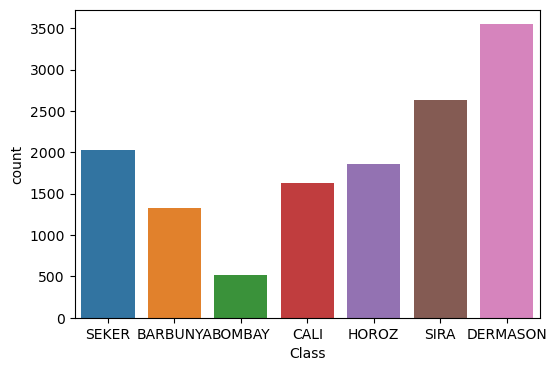

In [13]:
plt.figure(figsize=(6,4))
sns.countplot(x='Class', data=dataset)
plt.show()

In [14]:
#Data Transformation: creating a dict file
Class = {'DERMASON': 0,'SIRA':1,'SEKER':2,'HOROZ': 3,'CALI': 4,'BARBUNYA':5,'BOMBAY':6}
dataset.Class = [Class[item] for item in dataset.Class]

In [15]:
dataset['Class'].value_counts()

Class
0    3546
1    2636
2    2027
3    1860
4    1630
5    1322
6     522
Name: count, dtype: int64

In [16]:
y = dataset['Class']
X = dataset.drop('Class', axis=1)

In [17]:
dataset.columns

Index(['Area', 'Perimeter', 'MajorAxisLength', 'MinorAxisLength',
       'AspectRation', 'Eccentricity', 'ConvexArea', 'EquivDiameter', 'Extent',
       'Solidity', 'roundness', 'Compactness', 'ShapeFactor1', 'ShapeFactor2',
       'ShapeFactor3', 'ShapeFactor4', 'Class'],
      dtype='object')

In [18]:
scaler = RobustScaler()
X = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)

In [19]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, shuffle=True, random_state=42)

In [20]:
X_train.shape, y_train.shape,X_test.shape,y_test.shape

((10834, 16), (10834,), (2709, 16), (2709,))

# 1. RandomForestClassifier

In [21]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report,roc_auc_score,precision_score,recall_score,f1_score
from sklearn.ensemble import RandomForestClassifier
RF = RandomForestClassifier(criterion='entropy',max_features='sqrt',min_samples_split=3,n_estimators=500,random_state=0,max_depth=20, max_leaf_nodes=400, n_jobs=-1)
RF.fit(X_train, y_train)
pred = RF.predict(X_test)
print(classification_report(y_test,pred))

              precision    recall  f1-score   support

           0       0.91      0.92      0.92       707
           1       0.88      0.87      0.87       534
           2       0.95      0.94      0.94       414
           3       0.96      0.95      0.95       376
           4       0.92      0.96      0.94       305
           5       0.94      0.89      0.91       259
           6       1.00      1.00      1.00       114

    accuracy                           0.92      2709
   macro avg       0.94      0.93      0.93      2709
weighted avg       0.92      0.92      0.92      2709



In [22]:
accuracy=accuracy_score(y_test,pred)
accuracy

0.9235880398671097

In [23]:
precision=precision_score(y_test, pred, pos_label='positive',average='macro')
precision

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9360175743679087

In [24]:
recall=recall_score(y_test, pred,pos_label='positive',average='macro')
recall

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9334837923956643

In [25]:
f1_score=f1_score(y_test, pred,pos_label='positive',average='macro')
f1_score

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9346213241292595

In [26]:
Random_forest = pd.DataFrame({'accuracy':accuracy,
                   'precision':precision,'recall':recall,'f1_score':f1_score},
       columns=['accuracy','precision','recall','f1_score'],index=["performance"])
Random_forest

,accuracy,precision,recall,f1_score
performance,0.923588,0.936018,0.933484,0.934621


DecisionTreeClassifier

In [27]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report,roc_auc_score
from sklearn.tree import DecisionTreeClassifier
model=DecisionTreeClassifier(max_depth=20,criterion='gini',max_features='sqrt',splitter='best', max_leaf_nodes=100 ,min_samples_split=3)
model.fit(X_train, y_train)
pred = model.predict(X_test)
print(classification_report(y_test,pred))

              precision    recall  f1-score   support

           0       0.89      0.91      0.90       707
           1       0.86      0.85      0.86       534
           2       0.92      0.93      0.92       414
           3       0.96      0.93      0.94       376
           4       0.87      0.93      0.90       305
           5       0.91      0.83      0.87       259
           6       1.00      1.00      1.00       114

    accuracy                           0.90      2709
   macro avg       0.92      0.91      0.91      2709
weighted avg       0.90      0.90      0.90      2709



In [28]:
accuracy=accuracy_score(y_test,pred)
accuracy

0.9029162052417866

In [29]:
precision=precision_score(y_test, pred, pos_label='positive',average='macro')
precision

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9162003927244058

In [30]:
recall=recall_score(y_test, pred,pos_label='positive',average='macro')
recall

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9121668985619044

In [31]:
import sklearn.metrics as metrics
f1_score=metrics.f1_score(y_test, pred,pos_label='positive',average='macro')
f1_score

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9137396892630492

In [32]:
DT = pd.DataFrame({'accuracy':accuracy,
                   'precision':precision,'recall':recall,'f1_score':f1_score},
       columns=['accuracy','precision','recall','f1_score'],index=["performance"])
DT

,accuracy,precision,recall,f1_score
performance,0.902916,0.9162,0.912167,0.91374


XGBClassifier

In [33]:
import xgboost as xgb
model_xgb= xgb.XGBClassifier(random_state=42,verbosity=0, min_child_weight=2,
                             max_depth=4, learning_rate=0.15, gamma=0.22, colsample_bytree=0.5)
model_xgb.fit(X_train, y_train)
pred = model_xgb.predict(X_test)
print(classification_report(y_test,pred))

              precision    recall  f1-score   support

           0       0.91      0.93      0.92       707
           1       0.88      0.88      0.88       534
           2       0.95      0.94      0.95       414
           3       0.97      0.95      0.96       376
           4       0.93      0.96      0.95       305
           5       0.94      0.90      0.92       259
           6       1.00      1.00      1.00       114

    accuracy                           0.93      2709
   macro avg       0.94      0.94      0.94      2709
weighted avg       0.93      0.93      0.93      2709



In [34]:

accuracy=accuracy_score(y_test,pred)
accuracy

0.9287559985234404

In [35]:
precision=precision_score(y_test, pred, pos_label='positive',average='macro')
precision

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9408877577227556

In [36]:
recall=recall_score(y_test, pred,pos_label='positive',average='macro')
recall

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9380080113905143

In [37]:
f1_score=metrics.f1_score(y_test, pred,pos_label='positive',average='macro')
f1_score

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.939342753181991

In [38]:
xgb = pd.DataFrame({'accuracy':accuracy,
                   'precision':precision,'recall':recall,'f1_score':f1_score},
       columns=['accuracy','precision','recall','f1_score'],index=["performance"])
xgb

,accuracy,precision,recall,f1_score
performance,0.928756,0.940888,0.938008,0.939343


CatBoostClassifier

In [39]:
import catboost as cb
model_cb= cb.CatBoostClassifier(random_state=42,learning_rate=0.1, l2_leaf_reg=4, iterations=600, depth= 6)
model_cb.fit(X_train, y_train)
pred = model_cb.predict(X_test)
print(classification_report(y_test,pred))

0:	learn: 1.5683753	total: 225ms	remaining: 2m 14s
1:	learn: 1.3328542	total: 268ms	remaining: 1m 20s
2:	learn: 1.1660652	total: 312ms	remaining: 1m 2s
3:	learn: 1.0357773	total: 362ms	remaining: 54s
4:	learn: 0.9376356	total: 412ms	remaining: 49.1s
5:	learn: 0.8535058	total: 459ms	remaining: 45.5s
6:	learn: 0.7871135	total: 508ms	remaining: 43s
7:	learn: 0.7262942	total: 554ms	remaining: 41s
8:	learn: 0.6754694	total: 603ms	remaining: 39.6s
9:	learn: 0.6283282	total: 647ms	remaining: 38.2s
10:	learn: 0.5895205	total: 692ms	remaining: 37s
11:	learn: 0.5537265	total: 741ms	remaining: 36.3s
12:	learn: 0.5232043	total: 803ms	remaining: 36.2s
13:	learn: 0.4962102	total: 871ms	remaining: 36.5s
14:	learn: 0.4710798	total: 927ms	remaining: 36.1s
15:	learn: 0.4498410	total: 981ms	remaining: 35.8s
16:	learn: 0.4309617	total: 1.04s	remaining: 35.6s
17:	learn: 0.4129344	total: 1.09s	remaining: 35.1s
18:	learn: 0.3963804	total: 1.13s	remaining: 34.7s
19:	learn: 0.3814272	total: 1.21s	remaining: 35

162:	learn: 0.1617446	total: 9.2s	remaining: 24.7s
163:	learn: 0.1613179	total: 9.26s	remaining: 24.6s
164:	learn: 0.1610821	total: 9.3s	remaining: 24.5s
165:	learn: 0.1607180	total: 9.36s	remaining: 24.5s
166:	learn: 0.1605177	total: 9.42s	remaining: 24.4s
167:	learn: 0.1603263	total: 9.47s	remaining: 24.3s
168:	learn: 0.1601048	total: 9.52s	remaining: 24.3s
169:	learn: 0.1597882	total: 9.56s	remaining: 24.2s
170:	learn: 0.1596023	total: 9.62s	remaining: 24.1s
171:	learn: 0.1593522	total: 9.67s	remaining: 24.1s
172:	learn: 0.1590990	total: 9.73s	remaining: 24s
173:	learn: 0.1587607	total: 9.79s	remaining: 24s
174:	learn: 0.1585919	total: 9.85s	remaining: 23.9s
175:	learn: 0.1583815	total: 9.9s	remaining: 23.9s
176:	learn: 0.1580660	total: 9.95s	remaining: 23.8s
177:	learn: 0.1578665	total: 10s	remaining: 23.7s
178:	learn: 0.1577656	total: 10.1s	remaining: 23.6s
179:	learn: 0.1574844	total: 10.1s	remaining: 23.6s
180:	learn: 0.1571004	total: 10.1s	remaining: 23.5s
181:	learn: 0.1566576

321:	learn: 0.1308721	total: 17.4s	remaining: 15.1s
322:	learn: 0.1306385	total: 17.5s	remaining: 15s
323:	learn: 0.1304730	total: 17.5s	remaining: 14.9s
324:	learn: 0.1303251	total: 17.6s	remaining: 14.9s
325:	learn: 0.1301562	total: 17.6s	remaining: 14.8s
326:	learn: 0.1300030	total: 17.7s	remaining: 14.8s
327:	learn: 0.1298928	total: 17.7s	remaining: 14.7s
328:	learn: 0.1297023	total: 17.8s	remaining: 14.7s
329:	learn: 0.1295626	total: 17.8s	remaining: 14.6s
330:	learn: 0.1294109	total: 17.9s	remaining: 14.5s
331:	learn: 0.1292753	total: 17.9s	remaining: 14.5s
332:	learn: 0.1292121	total: 18s	remaining: 14.4s
333:	learn: 0.1290579	total: 18s	remaining: 14.4s
334:	learn: 0.1289130	total: 18.1s	remaining: 14.3s
335:	learn: 0.1288223	total: 18.1s	remaining: 14.2s
336:	learn: 0.1287697	total: 18.2s	remaining: 14.2s
337:	learn: 0.1286153	total: 18.2s	remaining: 14.1s
338:	learn: 0.1285349	total: 18.3s	remaining: 14.1s
339:	learn: 0.1284571	total: 18.3s	remaining: 14s
340:	learn: 0.128287

482:	learn: 0.1123644	total: 25.5s	remaining: 6.18s
483:	learn: 0.1122755	total: 25.6s	remaining: 6.12s
484:	learn: 0.1121883	total: 25.6s	remaining: 6.07s
485:	learn: 0.1120900	total: 25.7s	remaining: 6.02s
486:	learn: 0.1120061	total: 25.7s	remaining: 5.96s
487:	learn: 0.1118103	total: 25.7s	remaining: 5.91s
488:	learn: 0.1117310	total: 25.8s	remaining: 5.85s
489:	learn: 0.1115898	total: 25.8s	remaining: 5.8s
490:	learn: 0.1114237	total: 25.9s	remaining: 5.75s
491:	learn: 0.1113054	total: 25.9s	remaining: 5.69s
492:	learn: 0.1112668	total: 26s	remaining: 5.64s
493:	learn: 0.1110997	total: 26s	remaining: 5.59s
494:	learn: 0.1110393	total: 26.1s	remaining: 5.54s
495:	learn: 0.1109504	total: 26.1s	remaining: 5.48s
496:	learn: 0.1108350	total: 26.2s	remaining: 5.43s
497:	learn: 0.1107701	total: 26.2s	remaining: 5.37s
498:	learn: 0.1106833	total: 26.3s	remaining: 5.32s
499:	learn: 0.1106014	total: 26.3s	remaining: 5.27s
500:	learn: 0.1105104	total: 26.4s	remaining: 5.21s
501:	learn: 0.110

In [40]:
accuracy=accuracy_score(y_test,pred)
accuracy

0.9276485788113695

In [41]:
precision=precision_score(y_test, pred, pos_label='positive',average='macro')
precision

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9395363707464108

In [42]:
recall=recall_score(y_test, pred,pos_label='positive',average='macro')
recall

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.939267635271234

In [43]:
f1_score=metrics.f1_score(y_test, pred,pos_label='positive',average='macro')
f1_score

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9393526567835105

In [44]:
Cb = pd.DataFrame({'accuracy':accuracy,
                   'precision':precision,'recall':recall,'f1_score':f1_score},
       columns=['accuracy','precision','recall','f1_score'],index=["performance"])
Cb

,accuracy,precision,recall,f1_score
performance,0.927649,0.939536,0.939268,0.939353


LGBMClassifier

In [45]:
from lightgbm import LGBMClassifier
model_lgb=LGBMClassifier(random_state=42)
model_lgb.fit(X_train, y_train)
pred = model_lgb.predict(X_test)
print(classification_report(y_test,pred))

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001317 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 4080
[LightGBM] [Info] Number of data points in the train set: 10834, number of used features: 16
[LightGBM] [Info] Start training from score -1.339237
[LightGBM] [Info] Start training from score -1.639800
[LightGBM] [Info] Start training from score -1.904594
[LightGBM] [Info] Start training from score -1.987948
[LightGBM] [Info] Start training from score -2.101277
[LightGBM] [Info] Start training from score -2.321594
[LightGBM] [Info] Start training from score -3.279177
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with 

In [46]:
accuracy=accuracy_score(y_test,pred)
accuracy

0.9228497600590624

In [47]:
precision=precision_score(y_test, pred, pos_label='positive',average='macro')
precision

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9366187154253209

In [48]:
recall=recall_score(y_test, pred,pos_label='positive',average='macro')
recall

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.935013865088709

In [49]:
f1_score=metrics.f1_score(y_test, pred,pos_label='positive',average='macro')
f1_score

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.935765063783038

In [50]:
lgbm = pd.DataFrame({'accuracy':accuracy,
                   'precision':precision,'recall':recall,'f1_score':f1_score},
       columns=['accuracy','precision','recall','f1_score'],index=["performance"])
lgbm

,accuracy,precision,recall,f1_score
performance,0.92285,0.936619,0.935014,0.935765


VotingClassifier

In [51]:
from sklearn.ensemble import VotingClassifier
voting_model = VotingClassifier(estimators=[('lgb', model_lgb), ('cb', model_cb),('xgb', model_xgb),('RF', RF),('DT', model)], voting='soft')

voting_model.fit(X_train, y_train)
pred = voting_model.predict(X_test)
print(classification_report(y_test,pred))

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005843 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4080
[LightGBM] [Info] Number of data points in the train set: 10834, number of used features: 16
[LightGBM] [Info] Start training from score -1.339237
[LightGBM] [Info] Start training from score -1.639800
[LightGBM] [Info] Start training from score -1.904594
[LightGBM] [Info] Start training from score -1.987948
[LightGBM] [Info] Start training from score -2.101277
[LightGBM] [Info] Start training from score -2.321594
[LightGBM] [Info] Start training from score -3.279177
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

138:	learn: 0.1692892	total: 7.67s	remaining: 25.5s
139:	learn: 0.1690372	total: 7.73s	remaining: 25.4s
140:	learn: 0.1687437	total: 7.78s	remaining: 25.3s
141:	learn: 0.1682304	total: 7.84s	remaining: 25.3s
142:	learn: 0.1676761	total: 7.9s	remaining: 25.2s
143:	learn: 0.1674685	total: 7.95s	remaining: 25.2s
144:	learn: 0.1670617	total: 8.01s	remaining: 25.1s
145:	learn: 0.1668113	total: 8.06s	remaining: 25.1s
146:	learn: 0.1665775	total: 8.11s	remaining: 25s
147:	learn: 0.1662342	total: 8.16s	remaining: 24.9s
148:	learn: 0.1659144	total: 8.22s	remaining: 24.9s
149:	learn: 0.1657188	total: 8.27s	remaining: 24.8s
150:	learn: 0.1654154	total: 8.31s	remaining: 24.7s
151:	learn: 0.1650737	total: 8.36s	remaining: 24.6s
152:	learn: 0.1646031	total: 8.41s	remaining: 24.6s
153:	learn: 0.1642944	total: 8.46s	remaining: 24.5s
154:	learn: 0.1639741	total: 8.5s	remaining: 24.4s
155:	learn: 0.1638389	total: 8.55s	remaining: 24.3s
156:	learn: 0.1637493	total: 8.6s	remaining: 24.3s
157:	learn: 0.163

298:	learn: 0.1343998	total: 16.1s	remaining: 16.2s
299:	learn: 0.1342987	total: 16.1s	remaining: 16.1s
300:	learn: 0.1341334	total: 16.2s	remaining: 16.1s
301:	learn: 0.1340429	total: 16.2s	remaining: 16s
302:	learn: 0.1338253	total: 16.3s	remaining: 16s
303:	learn: 0.1336480	total: 16.3s	remaining: 15.9s
304:	learn: 0.1334362	total: 16.4s	remaining: 15.8s
305:	learn: 0.1332562	total: 16.4s	remaining: 15.8s
306:	learn: 0.1330429	total: 16.5s	remaining: 15.8s
307:	learn: 0.1329557	total: 16.6s	remaining: 15.7s
308:	learn: 0.1328094	total: 16.6s	remaining: 15.6s
309:	learn: 0.1327125	total: 16.7s	remaining: 15.6s
310:	learn: 0.1325313	total: 16.7s	remaining: 15.5s
311:	learn: 0.1323280	total: 16.8s	remaining: 15.5s
312:	learn: 0.1322332	total: 16.8s	remaining: 15.4s
313:	learn: 0.1320672	total: 16.9s	remaining: 15.4s
314:	learn: 0.1318953	total: 16.9s	remaining: 15.3s
315:	learn: 0.1316769	total: 16.9s	remaining: 15.2s
316:	learn: 0.1315813	total: 17s	remaining: 15.2s
317:	learn: 0.1314

460:	learn: 0.1144702	total: 24.3s	remaining: 7.32s
461:	learn: 0.1143848	total: 24.3s	remaining: 7.27s
462:	learn: 0.1142766	total: 24.4s	remaining: 7.21s
463:	learn: 0.1141616	total: 24.4s	remaining: 7.16s
464:	learn: 0.1140725	total: 24.5s	remaining: 7.1s
465:	learn: 0.1140431	total: 24.5s	remaining: 7.05s
466:	learn: 0.1139448	total: 24.6s	remaining: 6.99s
467:	learn: 0.1138846	total: 24.6s	remaining: 6.94s
468:	learn: 0.1138157	total: 24.7s	remaining: 6.89s
469:	learn: 0.1137346	total: 24.7s	remaining: 6.83s
470:	learn: 0.1136392	total: 24.7s	remaining: 6.78s
471:	learn: 0.1135402	total: 24.8s	remaining: 6.72s
472:	learn: 0.1133496	total: 24.8s	remaining: 6.67s
473:	learn: 0.1132792	total: 24.9s	remaining: 6.62s
474:	learn: 0.1132081	total: 24.9s	remaining: 6.56s
475:	learn: 0.1131096	total: 25s	remaining: 6.51s
476:	learn: 0.1130195	total: 25s	remaining: 6.46s
477:	learn: 0.1129550	total: 25.1s	remaining: 6.4s
478:	learn: 0.1128644	total: 25.1s	remaining: 6.35s
479:	learn: 0.1126

In [52]:
accuracy=accuracy_score(y_test,pred)
accuracy

0.9217423403469915

In [53]:
precision=precision_score(y_test, pred, pos_label='positive',average='macro')
precision

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9360344068960025

In [54]:
recall=recall_score(y_test, pred,pos_label='positive',average='macro')
recall

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9336915126469217

In [55]:
f1_score=metrics.f1_score(y_test, pred,pos_label='positive',average='macro')
f1_score

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9347927064148734

In [56]:
vot = pd.DataFrame({'accuracy':accuracy,
                   'precision':precision,'recall':recall,'f1_score':f1_score},
       columns=['accuracy','precision','recall','f1_score'],index=["performance"])
vot

,accuracy,precision,recall,f1_score
performance,0.921742,0.936034,0.933692,0.934793


In [57]:
from sklearn.ensemble import VotingClassifier
voting_model = VotingClassifier(estimators=[('cb', model_cb),('xgb', model_xgb)], voting='soft')
voting_model.fit(X_train, y_train)
pred = voting_model.predict(X_test)
print(classification_report(y_test,pred))

0:	learn: 1.5683753	total: 69.1ms	remaining: 41.4s
1:	learn: 1.3328542	total: 119ms	remaining: 35.6s
2:	learn: 1.1660652	total: 173ms	remaining: 34.4s
3:	learn: 1.0357773	total: 221ms	remaining: 33s
4:	learn: 0.9376356	total: 272ms	remaining: 32.4s
5:	learn: 0.8535058	total: 322ms	remaining: 31.9s
6:	learn: 0.7871135	total: 377ms	remaining: 32s
7:	learn: 0.7262942	total: 427ms	remaining: 31.6s
8:	learn: 0.6754694	total: 479ms	remaining: 31.5s
9:	learn: 0.6283282	total: 532ms	remaining: 31.4s
10:	learn: 0.5895205	total: 583ms	remaining: 31.2s
11:	learn: 0.5537265	total: 636ms	remaining: 31.2s
12:	learn: 0.5232043	total: 685ms	remaining: 30.9s
13:	learn: 0.4962102	total: 738ms	remaining: 30.9s
14:	learn: 0.4710798	total: 788ms	remaining: 30.7s
15:	learn: 0.4498410	total: 843ms	remaining: 30.8s
16:	learn: 0.4309617	total: 896ms	remaining: 30.7s
17:	learn: 0.4129344	total: 944ms	remaining: 30.5s
18:	learn: 0.3963804	total: 1s	remaining: 30.6s
19:	learn: 0.3814272	total: 1.06s	remaining: 30

161:	learn: 0.1620722	total: 8.71s	remaining: 23.5s
162:	learn: 0.1617446	total: 8.77s	remaining: 23.5s
163:	learn: 0.1613179	total: 8.82s	remaining: 23.4s
164:	learn: 0.1610821	total: 8.87s	remaining: 23.4s
165:	learn: 0.1607180	total: 8.93s	remaining: 23.3s
166:	learn: 0.1605177	total: 8.98s	remaining: 23.3s
167:	learn: 0.1603263	total: 9.04s	remaining: 23.2s
168:	learn: 0.1601048	total: 9.11s	remaining: 23.2s
169:	learn: 0.1597882	total: 9.17s	remaining: 23.2s
170:	learn: 0.1596023	total: 9.24s	remaining: 23.2s
171:	learn: 0.1593522	total: 9.29s	remaining: 23.1s
172:	learn: 0.1590990	total: 9.34s	remaining: 23.1s
173:	learn: 0.1587607	total: 9.4s	remaining: 23s
174:	learn: 0.1585919	total: 9.45s	remaining: 23s
175:	learn: 0.1583815	total: 9.53s	remaining: 23s
176:	learn: 0.1580660	total: 9.6s	remaining: 22.9s
177:	learn: 0.1578665	total: 9.66s	remaining: 22.9s
178:	learn: 0.1577656	total: 9.73s	remaining: 22.9s
179:	learn: 0.1574844	total: 9.79s	remaining: 22.9s
180:	learn: 0.157100

323:	learn: 0.1304730	total: 17.6s	remaining: 15s
324:	learn: 0.1303251	total: 17.6s	remaining: 14.9s
325:	learn: 0.1301562	total: 17.7s	remaining: 14.8s
326:	learn: 0.1300030	total: 17.7s	remaining: 14.8s
327:	learn: 0.1298928	total: 17.8s	remaining: 14.7s
328:	learn: 0.1297023	total: 17.8s	remaining: 14.7s
329:	learn: 0.1295626	total: 17.9s	remaining: 14.6s
330:	learn: 0.1294109	total: 17.9s	remaining: 14.6s
331:	learn: 0.1292753	total: 18s	remaining: 14.5s
332:	learn: 0.1292121	total: 18s	remaining: 14.5s
333:	learn: 0.1290579	total: 18.1s	remaining: 14.4s
334:	learn: 0.1289130	total: 18.1s	remaining: 14.3s
335:	learn: 0.1288223	total: 18.2s	remaining: 14.3s
336:	learn: 0.1287697	total: 18.2s	remaining: 14.2s
337:	learn: 0.1286153	total: 18.3s	remaining: 14.2s
338:	learn: 0.1285349	total: 18.3s	remaining: 14.1s
339:	learn: 0.1284571	total: 18.4s	remaining: 14s
340:	learn: 0.1282877	total: 18.4s	remaining: 14s
341:	learn: 0.1281135	total: 18.5s	remaining: 13.9s
342:	learn: 0.1280422	

483:	learn: 0.1122755	total: 25.7s	remaining: 6.15s
484:	learn: 0.1121883	total: 25.7s	remaining: 6.1s
485:	learn: 0.1120900	total: 25.8s	remaining: 6.04s
486:	learn: 0.1120061	total: 25.8s	remaining: 5.99s
487:	learn: 0.1118103	total: 25.9s	remaining: 5.94s
488:	learn: 0.1117310	total: 25.9s	remaining: 5.88s
489:	learn: 0.1115898	total: 26s	remaining: 5.83s
490:	learn: 0.1114237	total: 26s	remaining: 5.78s
491:	learn: 0.1113054	total: 26.1s	remaining: 5.72s
492:	learn: 0.1112668	total: 26.1s	remaining: 5.67s
493:	learn: 0.1110997	total: 26.2s	remaining: 5.61s
494:	learn: 0.1110393	total: 26.2s	remaining: 5.56s
495:	learn: 0.1109504	total: 26.2s	remaining: 5.5s
496:	learn: 0.1108350	total: 26.3s	remaining: 5.45s
497:	learn: 0.1107701	total: 26.3s	remaining: 5.39s
498:	learn: 0.1106833	total: 26.4s	remaining: 5.34s
499:	learn: 0.1106014	total: 26.4s	remaining: 5.29s
500:	learn: 0.1105104	total: 26.5s	remaining: 5.24s
501:	learn: 0.1104410	total: 26.5s	remaining: 5.18s
502:	learn: 0.1103

In [58]:
accuracy=accuracy_score(y_test,pred)
accuracy

0.9276485788113695

In [59]:
precision=precision_score(y_test, pred, pos_label='positive',average='macro')
precision

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9398354401499837

In [60]:
recall=recall_score(y_test, pred,pos_label='positive',average='macro')
recall

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9387402461262216

In [61]:
f1_score=metrics.f1_score(y_test, pred,pos_label='positive',average='macro')
f1_score

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9392195966428912

In [62]:
vot = pd.DataFrame({'accuracy':accuracy,
                   'precision':precision,'recall':recall,'f1_score':f1_score},
       columns=['accuracy','precision','recall','f1_score'],index=["performance"])
vot

,accuracy,precision,recall,f1_score
performance,0.927649,0.939835,0.93874,0.93922


In [63]:
from sklearn.ensemble import VotingClassifier
voting_model = VotingClassifier(estimators=[('lgb', model_lgb), ('cb', model_cb)], voting='soft')

voting_model.fit(X_train, y_train)
pred = voting_model.predict(X_test)
print(classification_report(y_test,pred))

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003018 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4080
[LightGBM] [Info] Number of data points in the train set: 10834, number of used features: 16
[LightGBM] [Info] Start training from score -1.339237
[LightGBM] [Info] Start training from score -1.639800
[LightGBM] [Info] Start training from score -1.904594
[LightGBM] [Info] Start training from score -1.987948
[LightGBM] [Info] Start training from score -2.101277
[LightGBM] [Info] Start training from score -2.321594
[LightGBM] [Info] Start training from score -3.279177
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

138:	learn: 0.1692892	total: 7.24s	remaining: 24s
139:	learn: 0.1690372	total: 7.29s	remaining: 24s
140:	learn: 0.1687437	total: 7.34s	remaining: 23.9s
141:	learn: 0.1682304	total: 7.39s	remaining: 23.8s
142:	learn: 0.1676761	total: 7.44s	remaining: 23.8s
143:	learn: 0.1674685	total: 7.49s	remaining: 23.7s
144:	learn: 0.1670617	total: 7.54s	remaining: 23.6s
145:	learn: 0.1668113	total: 7.58s	remaining: 23.6s
146:	learn: 0.1665775	total: 7.63s	remaining: 23.5s
147:	learn: 0.1662342	total: 7.67s	remaining: 23.4s
148:	learn: 0.1659144	total: 7.72s	remaining: 23.4s
149:	learn: 0.1657188	total: 7.77s	remaining: 23.3s
150:	learn: 0.1654154	total: 7.81s	remaining: 23.2s
151:	learn: 0.1650737	total: 7.86s	remaining: 23.2s
152:	learn: 0.1646031	total: 7.91s	remaining: 23.1s
153:	learn: 0.1642944	total: 7.96s	remaining: 23s
154:	learn: 0.1639741	total: 8s	remaining: 23s
155:	learn: 0.1638389	total: 8.05s	remaining: 22.9s
156:	learn: 0.1637493	total: 8.09s	remaining: 22.8s
157:	learn: 0.1635191	t

297:	learn: 0.1345108	total: 15.1s	remaining: 15.3s
298:	learn: 0.1343998	total: 15.2s	remaining: 15.3s
299:	learn: 0.1342987	total: 15.2s	remaining: 15.2s
300:	learn: 0.1341334	total: 15.3s	remaining: 15.2s
301:	learn: 0.1340429	total: 15.3s	remaining: 15.1s
302:	learn: 0.1338253	total: 15.4s	remaining: 15.1s
303:	learn: 0.1336480	total: 15.5s	remaining: 15.1s
304:	learn: 0.1334362	total: 15.5s	remaining: 15s
305:	learn: 0.1332562	total: 15.6s	remaining: 15s
306:	learn: 0.1330429	total: 15.6s	remaining: 14.9s
307:	learn: 0.1329557	total: 15.7s	remaining: 14.9s
308:	learn: 0.1328094	total: 15.7s	remaining: 14.8s
309:	learn: 0.1327125	total: 15.8s	remaining: 14.8s
310:	learn: 0.1325313	total: 15.8s	remaining: 14.7s
311:	learn: 0.1323280	total: 15.9s	remaining: 14.7s
312:	learn: 0.1322332	total: 15.9s	remaining: 14.6s
313:	learn: 0.1320672	total: 16s	remaining: 14.6s
314:	learn: 0.1318953	total: 16s	remaining: 14.5s
315:	learn: 0.1316769	total: 16.1s	remaining: 14.5s
316:	learn: 0.131581

457:	learn: 0.1148216	total: 23.9s	remaining: 7.42s
458:	learn: 0.1147153	total: 24s	remaining: 7.37s
459:	learn: 0.1145730	total: 24s	remaining: 7.32s
460:	learn: 0.1144702	total: 24.1s	remaining: 7.26s
461:	learn: 0.1143848	total: 24.1s	remaining: 7.21s
462:	learn: 0.1142766	total: 24.2s	remaining: 7.16s
463:	learn: 0.1141616	total: 24.2s	remaining: 7.11s
464:	learn: 0.1140725	total: 24.3s	remaining: 7.05s
465:	learn: 0.1140431	total: 24.3s	remaining: 7s
466:	learn: 0.1139448	total: 24.4s	remaining: 6.94s
467:	learn: 0.1138846	total: 24.4s	remaining: 6.89s
468:	learn: 0.1138157	total: 24.5s	remaining: 6.84s
469:	learn: 0.1137346	total: 24.5s	remaining: 6.78s
470:	learn: 0.1136392	total: 24.6s	remaining: 6.73s
471:	learn: 0.1135402	total: 24.6s	remaining: 6.67s
472:	learn: 0.1133496	total: 24.7s	remaining: 6.62s
473:	learn: 0.1132792	total: 24.7s	remaining: 6.57s
474:	learn: 0.1132081	total: 24.7s	remaining: 6.51s
475:	learn: 0.1131096	total: 24.8s	remaining: 6.46s
476:	learn: 0.11301

In [64]:
accuracy=accuracy_score(y_test,pred)
accuracy

0.9250645994832042

In [65]:
precision=precision_score(y_test, pred, pos_label='positive',average='macro')
precision

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9390199690843514

In [66]:
recall=recall_score(y_test, pred,pos_label='positive',average='macro')
recall

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9367544011438106

In [67]:
f1_score=metrics.f1_score(y_test, pred,pos_label='positive',average='macro')
f1_score

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9378146499718726

In [68]:
vot = pd.DataFrame({'accuracy':accuracy,
                   'precision':precision,'recall':recall,'f1_score':f1_score},
       columns=['accuracy','precision','recall','f1_score'],index=["performance"])
vot

,accuracy,precision,recall,f1_score
performance,0.925065,0.93902,0.936754,0.937815


In [69]:
from sklearn.ensemble import VotingClassifier
voting_model = VotingClassifier(estimators=[('RF', RF),('DT', model)], voting='soft')

voting_model.fit(X_train, y_train)
pred = voting_model.predict(X_test)
print(classification_report(y_test,pred))

              precision    recall  f1-score   support

           0       0.92      0.91      0.91       707
           1       0.85      0.87      0.86       534
           2       0.93      0.94      0.93       414
           3       0.95      0.94      0.94       376
           4       0.88      0.94      0.91       305
           5       0.92      0.83      0.87       259
           6       0.99      1.00      1.00       114

    accuracy                           0.91      2709
   macro avg       0.92      0.92      0.92      2709
weighted avg       0.91      0.91      0.91      2709



In [70]:
accuracy=accuracy_score(y_test,pred)
accuracy

0.9095607235142119

In [71]:
precision=precision_score(y_test, pred, pos_label='positive',average='macro')
precision

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9203042611193352

In [72]:
recall=recall_score(y_test, pred,pos_label='positive',average='macro')
recall

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9179673490333286

In [73]:
f1_score=metrics.f1_score(y_test, pred,pos_label='positive',average='macro')
f1_score

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9186610600342872

In [74]:
vot = pd.DataFrame({'accuracy':accuracy,
                   'precision':precision,'recall':recall,'f1_score':f1_score},
       columns=['accuracy','precision','recall','f1_score'],index=["performance"])
vot

,accuracy,precision,recall,f1_score
performance,0.909561,0.920304,0.917967,0.918661


# shap

In [75]:
#Importing shap module
import shap
#intialize JS visualization
shap.initjs()

In [76]:
#Shap tree explainer
shap_explainer = shap.TreeExplainer(model = model_xgb, model_output='margin')
shap_values = shap_explainer.shap_values(X_test)

model_output = "margin" has been renamed to model_output = "raw"
[04:18:49] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0750514818a16474a-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


In [77]:
#We will use below rows for prediction explanations using lime and shap
row = [100, 150,200, 250,300]

for row : 100  the real value is  6


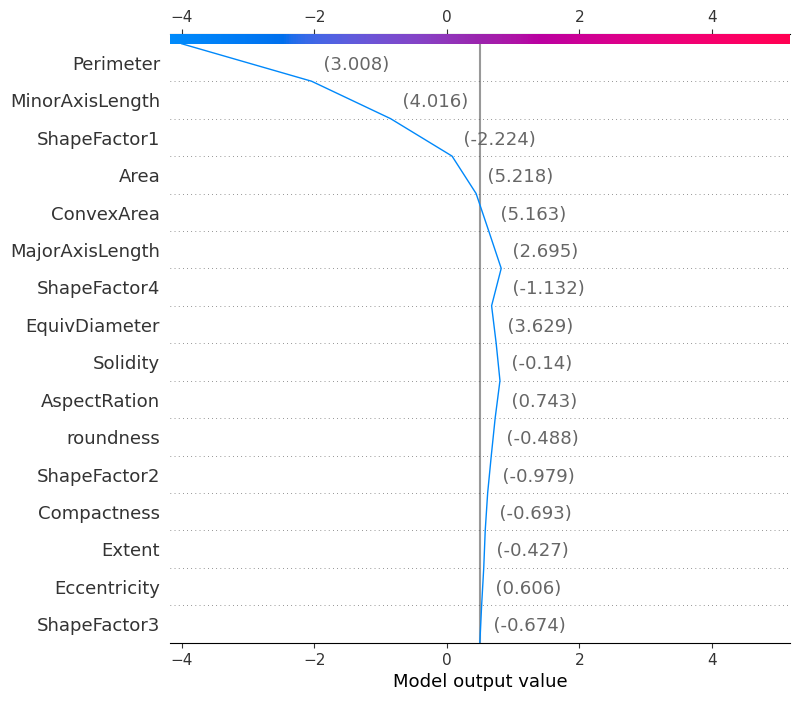

for row : 150  the real value is  2


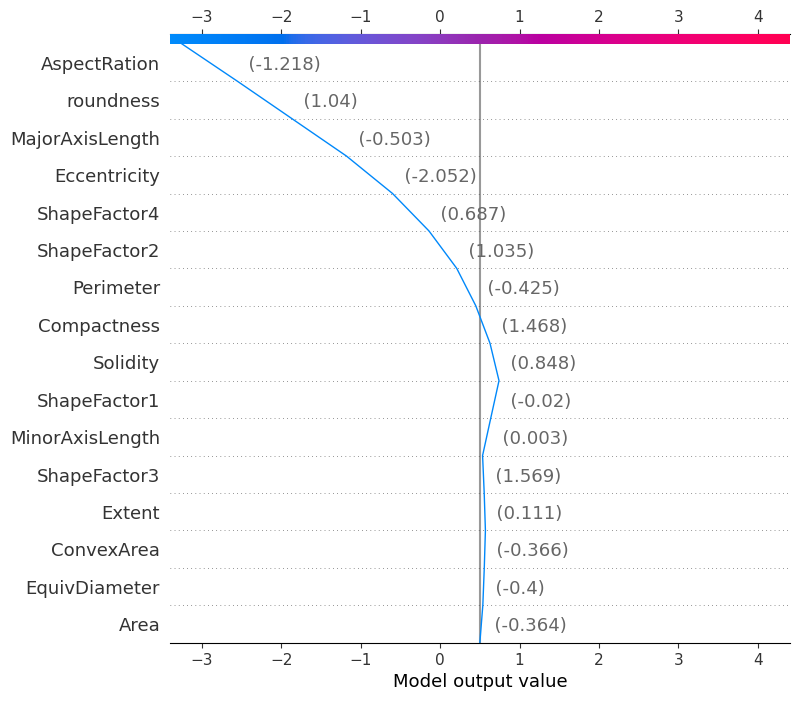

for row : 200  the real value is  3


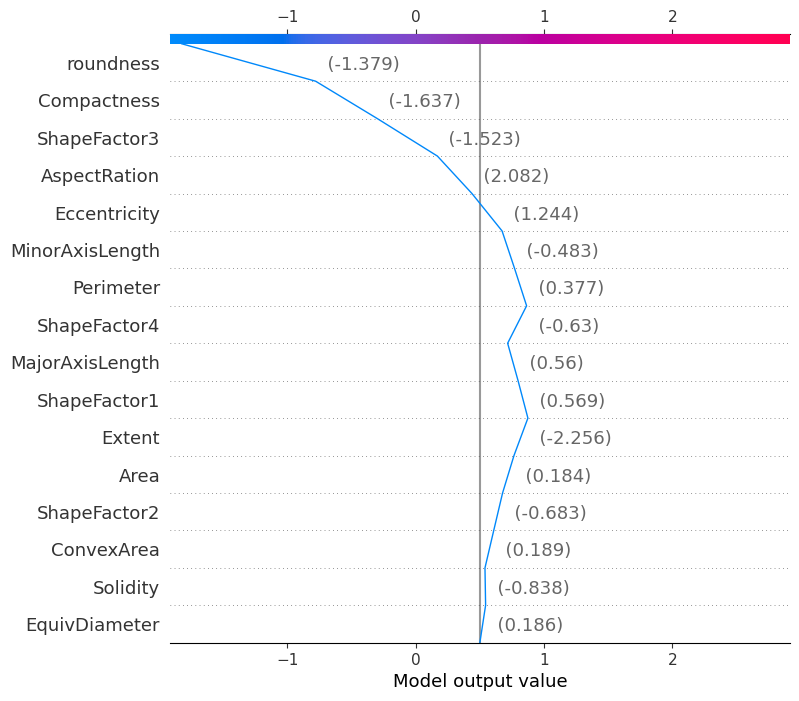

for row : 250  the real value is  1


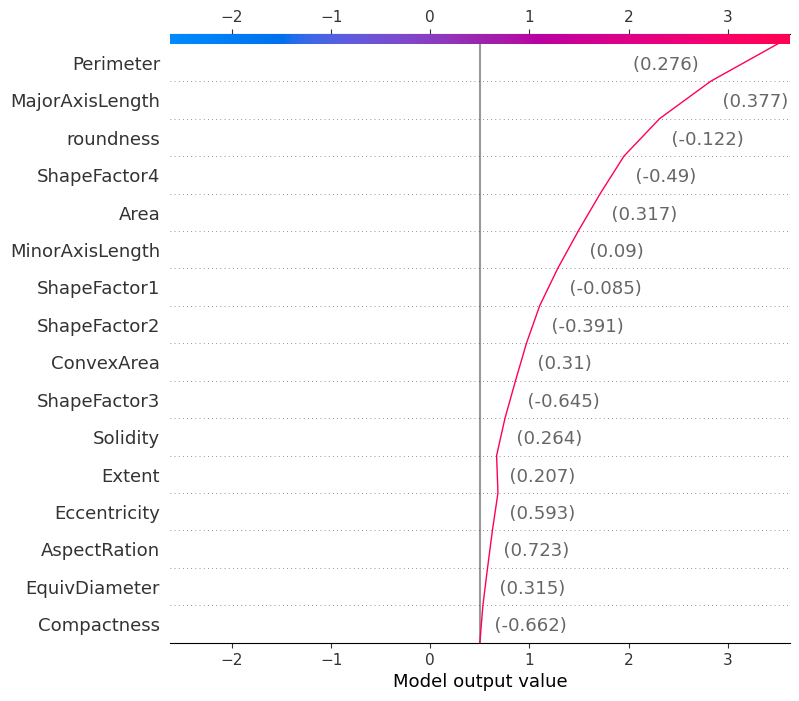

for row : 300  the real value is  5


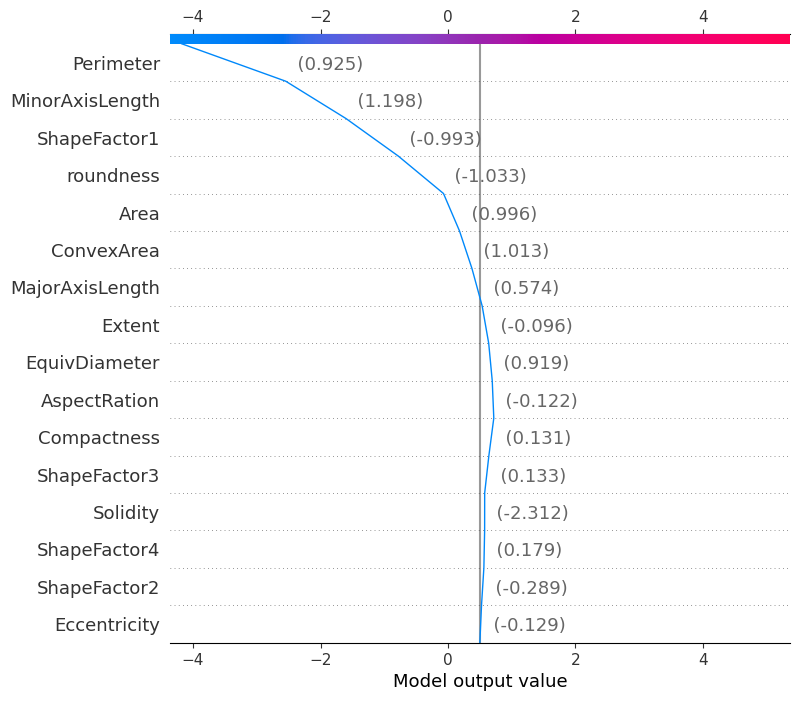

In [78]:
#Shap decision plot
for i in row:
    print("for row :",i," the real value is ", y_test.iloc[i])
    shap.decision_plot(
    base_value=shap_explainer.expected_value[1],
    shap_values=shap_values[1][i],
    features=X_test.iloc[i],
    feature_names=X_test.columns.tolist(),
    link="identity",
    new_base_value=0.5
    )

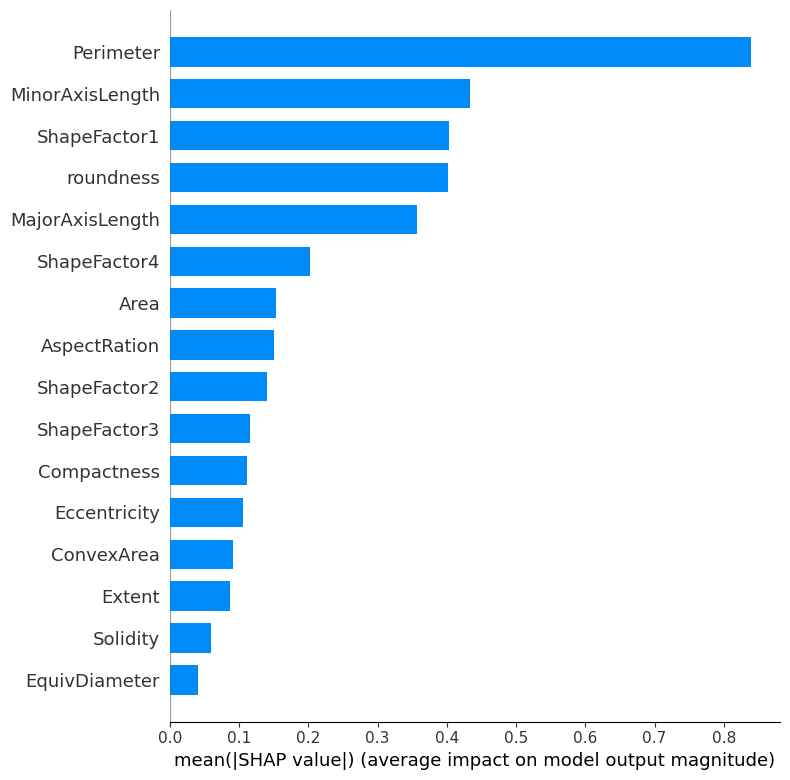

In [79]:
#bar chart
shap.summary_plot(shap_values = shap_values[1], features = X_test, max_display=16, plot_type='bar')

In [80]:
#summary plot of shap X_train
shap_values = shap_explainer.shap_values(X_train)

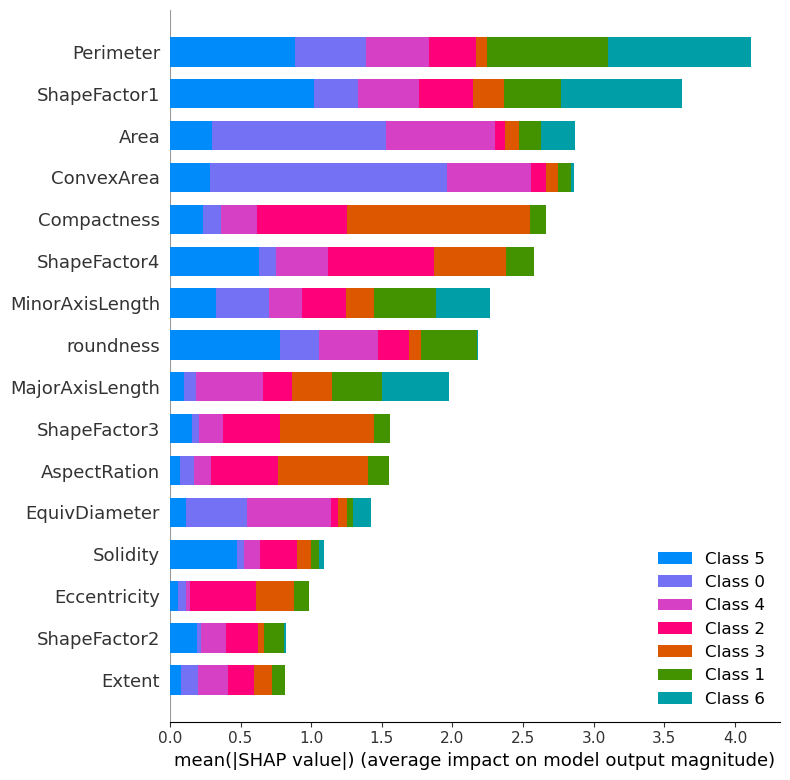

In [81]:
#shap summary plot of 
shap.summary_plot(shap_values, X_train, plot_type='bar')

# lime

In [83]:
# importing Lime
import lime
import lime.lime_tabular
#using tabuar explainer of lime
lime_explainer = lime.lime_tabular.LimeTabularExplainer(
   X_train.values,
    training_labels=y_train.values,
    feature_names=X_train.columns.tolist(),
    feature_selection="auto",
    class_names  = ["0","1","2","3","4","5","6"],

)

In [84]:
#Explanations using lime
for i in row:
    print("for row :",i," the real value is ", y_test.iloc[i])
    exp = lime_explainer.explain_instance(X_test.iloc[i], model_xgb.predict_proba, num_features=5)
    exp.show_in_notebook(show_table=True)

for row : 100  the real value is  6


for row : 150  the real value is  2


for row : 200  the real value is  3


for row : 250  the real value is  1


for row : 300  the real value is  5


# Handling imbalance problem

In [80]:
from imblearn.combine import SMOTETomek
Resample= SMOTETomek(sampling_strategy='not minority',random_state=10)
X_train,y_train=Resample.fit_resample(X_train,y_train)

In [81]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report,roc_auc_score,precision_score,recall_score,f1_score
from sklearn.ensemble import RandomForestClassifier
RF = RandomForestClassifier(criterion='entropy',max_features='sqrt',min_samples_split=3,n_estimators=500,random_state=0,max_depth=20, max_leaf_nodes=400, n_jobs=-1)
RF.fit(X_train, y_train)
pred = RF.predict(X_test)
print(classification_report(y_test,pred))

              precision    recall  f1-score   support

           0       0.93      0.90      0.91       707
           1       0.86      0.88      0.87       534
           2       0.94      0.95      0.94       414
           3       0.96      0.95      0.95       376
           4       0.92      0.95      0.94       305
           5       0.93      0.90      0.91       259
           6       1.00      1.00      1.00       114

    accuracy                           0.92      2709
   macro avg       0.93      0.93      0.93      2709
weighted avg       0.92      0.92      0.92      2709



In [82]:
accuracy=accuracy_score(y_test,pred)
accuracy

0.9210040605389442

In [83]:
precision=precision_score(y_test, pred, pos_label='positive',average='macro')
precision

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9326288511040699

In [84]:
recall=recall_score(y_test, pred,pos_label='positive',average='macro')
recall

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9333238480236882

In [85]:
f1_score=f1_score(y_test, pred,pos_label='positive',average='macro')
f1_score

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9328351846399929

In [86]:
Random_forest = pd.DataFrame({'accuracy':accuracy,
                   'precision':precision,'recall':recall,'f1_score':f1_score},
       columns=['accuracy','precision','recall','f1_score'],index=["performance"])
Random_forest

,accuracy,precision,recall,f1_score
performance,0.921004,0.932629,0.933324,0.932835


In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report,roc_auc_score
from sklearn.tree import DecisionTreeClassifier
model=DecisionTreeClassifier(max_depth=20,criterion='gini',max_features='sqrt',splitter='best', max_leaf_nodes=100 ,min_samples_split=3)
model.fit(X_train, y_train)
pred = model.predict(X_test)
print(classification_report(y_test,pred))

In [87]:
accuracy=accuracy_score(y_test,pred)
accuracy

0.9210040605389442

In [88]:
precision=precision_score(y_test, pred, pos_label='positive',average='macro')
precision

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9326288511040699

In [89]:
recall=recall_score(y_test, pred,pos_label='positive',average='macro')
recall

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9333238480236882

In [91]:
import sklearn.metrics as metrics
f1_score=metrics.f1_score(y_test, pred,pos_label='positive',average='macro')
f1_score

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9328351846399929

In [92]:
DT = pd.DataFrame({'accuracy':accuracy,
                   'precision':precision,'recall':recall,'f1_score':f1_score},
       columns=['accuracy','precision','recall','f1_score'],index=["performance"])
DT

,accuracy,precision,recall,f1_score
performance,0.921004,0.932629,0.933324,0.932835


In [93]:
import xgboost as xgb
model_xgb= xgb.XGBClassifier(random_state=42,verbosity=0, min_child_weight=2,
                             max_depth=4, learning_rate=0.15, gamma=0.22, colsample_bytree=0.5)
model_xgb.fit(X_train, y_train)
pred = model_xgb.predict(X_test)
print(classification_report(y_test,pred))

              precision    recall  f1-score   support

           0       0.93      0.90      0.91       707
           1       0.86      0.89      0.88       534
           2       0.94      0.95      0.95       414
           3       0.96      0.95      0.96       376
           4       0.93      0.95      0.94       305
           5       0.93      0.92      0.92       259
           6       1.00      1.00      1.00       114

    accuracy                           0.93      2709
   macro avg       0.94      0.94      0.94      2709
weighted avg       0.93      0.93      0.93      2709



In [94]:
accuracy=accuracy_score(y_test,pred)
accuracy

0.9250645994832042

In [95]:
precision=precision_score(y_test, pred, pos_label='positive',average='macro')
precision

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9361344929606933

In [96]:
recall=recall_score(y_test, pred,pos_label='positive',average='macro')
recall

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9380895554888873

In [97]:
import sklearn.metrics as metrics
f1_score=metrics.f1_score(y_test, pred,pos_label='positive',average='macro')
f1_score

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9370170895228499

In [98]:
XGB = pd.DataFrame({'accuracy':accuracy,
                   'precision':precision,'recall':recall,'f1_score':f1_score},
       columns=['accuracy','precision','recall','f1_score'],index=["performance"])
XGB

,accuracy,precision,recall,f1_score
performance,0.925065,0.936134,0.93809,0.937017


In [99]:
import catboost as cb
model_cb= cb.CatBoostClassifier(random_state=42,learning_rate=0.1, l2_leaf_reg=4, iterations=600, depth= 6)
model_cb.fit(X_train, y_train)
pred = model_cb.predict(X_test)
print(classification_report(y_test,pred))

0:	learn: 1.5523031	total: 49ms	remaining: 29.3s
1:	learn: 1.3240521	total: 94.4ms	remaining: 28.2s
2:	learn: 1.1532875	total: 143ms	remaining: 28.6s
3:	learn: 1.0220305	total: 194ms	remaining: 28.8s
4:	learn: 0.9225204	total: 249ms	remaining: 29.6s
5:	learn: 0.8392081	total: 303ms	remaining: 30s
6:	learn: 0.7697572	total: 366ms	remaining: 31s
7:	learn: 0.7110072	total: 422ms	remaining: 31.2s
8:	learn: 0.6578596	total: 481ms	remaining: 31.6s
9:	learn: 0.6121150	total: 546ms	remaining: 32.2s
10:	learn: 0.5712272	total: 607ms	remaining: 32.5s
11:	learn: 0.5337697	total: 661ms	remaining: 32.4s
12:	learn: 0.4999478	total: 713ms	remaining: 32.2s
13:	learn: 0.4692309	total: 771ms	remaining: 32.3s
14:	learn: 0.4441441	total: 827ms	remaining: 32.2s
15:	learn: 0.4214703	total: 879ms	remaining: 32.1s
16:	learn: 0.4010370	total: 937ms	remaining: 32.1s
17:	learn: 0.3819566	total: 1000ms	remaining: 32.3s
18:	learn: 0.3641484	total: 1.06s	remaining: 32.3s
19:	learn: 0.3487652	total: 1.11s	remaining:

161:	learn: 0.1209736	total: 9.31s	remaining: 25.2s
162:	learn: 0.1206008	total: 9.37s	remaining: 25.1s
163:	learn: 0.1202578	total: 9.47s	remaining: 25.2s
164:	learn: 0.1199242	total: 9.53s	remaining: 25.1s
165:	learn: 0.1197302	total: 9.58s	remaining: 25.1s
166:	learn: 0.1193952	total: 9.64s	remaining: 25s
167:	learn: 0.1191298	total: 9.69s	remaining: 24.9s
168:	learn: 0.1188892	total: 9.74s	remaining: 24.9s
169:	learn: 0.1187094	total: 9.8s	remaining: 24.8s
170:	learn: 0.1185738	total: 9.86s	remaining: 24.7s
171:	learn: 0.1184422	total: 9.92s	remaining: 24.7s
172:	learn: 0.1182361	total: 9.97s	remaining: 24.6s
173:	learn: 0.1179988	total: 10s	remaining: 24.6s
174:	learn: 0.1177516	total: 10.1s	remaining: 24.5s
175:	learn: 0.1174144	total: 10.1s	remaining: 24.4s
176:	learn: 0.1171369	total: 10.2s	remaining: 24.4s
177:	learn: 0.1169316	total: 10.2s	remaining: 24.3s
178:	learn: 0.1167777	total: 10.3s	remaining: 24.2s
179:	learn: 0.1165000	total: 10.3s	remaining: 24.1s
180:	learn: 0.116

323:	learn: 0.0931815	total: 18.3s	remaining: 15.6s
324:	learn: 0.0930849	total: 18.4s	remaining: 15.6s
325:	learn: 0.0929680	total: 18.4s	remaining: 15.5s
326:	learn: 0.0928795	total: 18.5s	remaining: 15.4s
327:	learn: 0.0927165	total: 18.5s	remaining: 15.4s
328:	learn: 0.0925874	total: 18.6s	remaining: 15.3s
329:	learn: 0.0923786	total: 18.6s	remaining: 15.3s
330:	learn: 0.0922718	total: 18.7s	remaining: 15.2s
331:	learn: 0.0921983	total: 18.8s	remaining: 15.1s
332:	learn: 0.0920867	total: 18.8s	remaining: 15.1s
333:	learn: 0.0920123	total: 18.9s	remaining: 15s
334:	learn: 0.0919379	total: 18.9s	remaining: 15s
335:	learn: 0.0918811	total: 19s	remaining: 14.9s
336:	learn: 0.0917450	total: 19s	remaining: 14.9s
337:	learn: 0.0916177	total: 19.1s	remaining: 14.8s
338:	learn: 0.0915230	total: 19.1s	remaining: 14.7s
339:	learn: 0.0913966	total: 19.2s	remaining: 14.7s
340:	learn: 0.0912329	total: 19.3s	remaining: 14.6s
341:	learn: 0.0911034	total: 19.3s	remaining: 14.6s
342:	learn: 0.090939

483:	learn: 0.0778776	total: 26.8s	remaining: 6.41s
484:	learn: 0.0778146	total: 26.8s	remaining: 6.36s
485:	learn: 0.0777462	total: 26.9s	remaining: 6.3s
486:	learn: 0.0776575	total: 26.9s	remaining: 6.24s
487:	learn: 0.0775728	total: 26.9s	remaining: 6.18s
488:	learn: 0.0775445	total: 27s	remaining: 6.13s
489:	learn: 0.0774620	total: 27.1s	remaining: 6.07s
490:	learn: 0.0773615	total: 27.1s	remaining: 6.02s
491:	learn: 0.0772926	total: 27.2s	remaining: 5.96s
492:	learn: 0.0772207	total: 27.2s	remaining: 5.91s
493:	learn: 0.0771710	total: 27.3s	remaining: 5.85s
494:	learn: 0.0771022	total: 27.3s	remaining: 5.79s
495:	learn: 0.0770145	total: 27.4s	remaining: 5.74s
496:	learn: 0.0769719	total: 27.4s	remaining: 5.68s
497:	learn: 0.0769270	total: 27.4s	remaining: 5.62s
498:	learn: 0.0768043	total: 27.5s	remaining: 5.57s
499:	learn: 0.0767059	total: 27.5s	remaining: 5.51s
500:	learn: 0.0766263	total: 27.6s	remaining: 5.45s
501:	learn: 0.0765415	total: 27.6s	remaining: 5.4s
502:	learn: 0.07

In [100]:
accuracy=accuracy_score(y_test,pred)
accuracy

0.9254337393872277

In [101]:
precision=precision_score(y_test, pred, pos_label='positive',average='macro')
precision

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9367000860278649

In [102]:
recall=recall_score(y_test, pred,pos_label='positive',average='macro')
recall

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9389956933403678

In [103]:
import sklearn.metrics as metrics
f1_score=metrics.f1_score(y_test, pred,pos_label='positive',average='macro')
f1_score

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9377941546170704

In [104]:
cb = pd.DataFrame({'accuracy':accuracy,
                   'precision':precision,'recall':recall,'f1_score':f1_score},
       columns=['accuracy','precision','recall','f1_score'],index=["performance"])
cb

,accuracy,precision,recall,f1_score
performance,0.925434,0.9367,0.938996,0.937794


In [105]:
from lightgbm import LGBMClassifier
model_lgb=LGBMClassifier(random_state=42)
model_lgb.fit(X_train, y_train)
pred = model_lgb.predict(X_test)
print(classification_report(y_test,pred))

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.002863 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4080
[LightGBM] [Info] Number of data points in the train set: 17196, number of used features: 16
[LightGBM] [Info] Start training from score -1.835625
[LightGBM] [Info] Start training from score -1.838545
[LightGBM] [Info] Start training from score -1.806168
[LightGBM] [Info] Start training from score -1.809004
[LightGBM] [Info] Start training from score -1.802282
[LightGBM] [Info] Start training from score -1.803694
[LightGBM] [Info] Start training from score -3.741165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

In [106]:
accuracy=accuracy_score(y_test,pred)
accuracy

0.9246954595791805

In [107]:
precision=precision_score(y_test, pred, pos_label='positive',average='macro')
precision

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9377830149711123

In [108]:
recall=recall_score(y_test, pred,pos_label='positive',average='macro')
recall

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9378613825812204

In [109]:
import sklearn.metrics as metrics
f1_score=metrics.f1_score(y_test, pred,pos_label='positive',average='macro')
f1_score

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9377764645034149

In [110]:
cb = pd.DataFrame({'accuracy':accuracy,
                   'precision':precision,'recall':recall,'f1_score':f1_score},
       columns=['accuracy','precision','recall','f1_score'],index=["performance"])
cb

,accuracy,precision,recall,f1_score
performance,0.924695,0.937783,0.937861,0.937776


In [111]:
from sklearn.ensemble import VotingClassifier
voting_model = VotingClassifier(estimators=[('lgb', model_lgb), ('cb', model_cb),('xgb', model_xgb),('RF', RF),('DT', model)], voting='soft')

voting_model.fit(X_train, y_train)
pred = voting_model.predict(X_test)
print(classification_report(y_test,pred))

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003554 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4080
[LightGBM] [Info] Number of data points in the train set: 17196, number of used features: 16
[LightGBM] [Info] Start training from score -1.835625
[LightGBM] [Info] Start training from score -1.838545
[LightGBM] [Info] Start training from score -1.806168
[LightGBM] [Info] Start training from score -1.809004
[LightGBM] [Info] Start training from score -1.802282
[LightGBM] [Info] Start training from score -1.803694
[LightGBM] [Info] Start training from score -3.741165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

131:	learn: 0.1305626	total: 7.04s	remaining: 24.9s
132:	learn: 0.1303016	total: 7.09s	remaining: 24.9s
133:	learn: 0.1300169	total: 7.13s	remaining: 24.8s
134:	learn: 0.1294595	total: 7.18s	remaining: 24.7s
135:	learn: 0.1292339	total: 7.23s	remaining: 24.7s
136:	learn: 0.1287184	total: 7.3s	remaining: 24.7s
137:	learn: 0.1283895	total: 7.36s	remaining: 24.6s
138:	learn: 0.1282486	total: 7.42s	remaining: 24.6s
139:	learn: 0.1279214	total: 7.47s	remaining: 24.6s
140:	learn: 0.1276358	total: 7.53s	remaining: 24.5s
141:	learn: 0.1272175	total: 7.58s	remaining: 24.4s
142:	learn: 0.1269178	total: 7.63s	remaining: 24.4s
143:	learn: 0.1266334	total: 7.69s	remaining: 24.3s
144:	learn: 0.1262539	total: 7.74s	remaining: 24.3s
145:	learn: 0.1258392	total: 7.79s	remaining: 24.2s
146:	learn: 0.1254856	total: 7.84s	remaining: 24.2s
147:	learn: 0.1250901	total: 7.89s	remaining: 24.1s
148:	learn: 0.1248228	total: 7.95s	remaining: 24.1s
149:	learn: 0.1246333	total: 8s	remaining: 24s
150:	learn: 0.1242

292:	learn: 0.0972207	total: 16.5s	remaining: 17.3s
293:	learn: 0.0970931	total: 16.6s	remaining: 17.3s
294:	learn: 0.0970342	total: 16.6s	remaining: 17.2s
295:	learn: 0.0968663	total: 16.7s	remaining: 17.2s
296:	learn: 0.0966357	total: 16.8s	remaining: 17.1s
297:	learn: 0.0964891	total: 16.8s	remaining: 17s
298:	learn: 0.0964222	total: 16.9s	remaining: 17s
299:	learn: 0.0962898	total: 16.9s	remaining: 16.9s
300:	learn: 0.0961050	total: 17s	remaining: 16.9s
301:	learn: 0.0959749	total: 17s	remaining: 16.8s
302:	learn: 0.0958604	total: 17.1s	remaining: 16.8s
303:	learn: 0.0955930	total: 17.2s	remaining: 16.7s
304:	learn: 0.0954446	total: 17.2s	remaining: 16.7s
305:	learn: 0.0953588	total: 17.3s	remaining: 16.6s
306:	learn: 0.0952566	total: 17.3s	remaining: 16.6s
307:	learn: 0.0951447	total: 17.4s	remaining: 16.5s
308:	learn: 0.0950635	total: 17.5s	remaining: 16.5s
309:	learn: 0.0949992	total: 17.5s	remaining: 16.4s
310:	learn: 0.0948416	total: 17.6s	remaining: 16.3s
311:	learn: 0.094781

455:	learn: 0.0801926	total: 25s	remaining: 7.88s
456:	learn: 0.0801566	total: 25s	remaining: 7.82s
457:	learn: 0.0801067	total: 25.1s	remaining: 7.77s
458:	learn: 0.0800750	total: 25.1s	remaining: 7.71s
459:	learn: 0.0800044	total: 25.2s	remaining: 7.66s
460:	learn: 0.0799103	total: 25.2s	remaining: 7.61s
461:	learn: 0.0797833	total: 25.3s	remaining: 7.55s
462:	learn: 0.0796992	total: 25.3s	remaining: 7.49s
463:	learn: 0.0796313	total: 25.4s	remaining: 7.44s
464:	learn: 0.0795729	total: 25.4s	remaining: 7.38s
465:	learn: 0.0794811	total: 25.5s	remaining: 7.33s
466:	learn: 0.0793970	total: 25.5s	remaining: 7.27s
467:	learn: 0.0792594	total: 25.6s	remaining: 7.22s
468:	learn: 0.0791440	total: 25.7s	remaining: 7.17s
469:	learn: 0.0790764	total: 25.7s	remaining: 7.11s
470:	learn: 0.0789868	total: 25.8s	remaining: 7.06s
471:	learn: 0.0788687	total: 25.8s	remaining: 7.01s
472:	learn: 0.0787949	total: 25.9s	remaining: 6.95s
473:	learn: 0.0786534	total: 25.9s	remaining: 6.9s
474:	learn: 0.078

In [112]:
accuracy=accuracy_score(y_test,pred)
accuracy

0.9265411590992987

In [113]:
precision=precision_score(y_test, pred, pos_label='positive',average='macro')
precision

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9369820094669381

In [114]:
recall=recall_score(y_test, pred,pos_label='positive',average='macro')
recall

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9387376475795025

In [115]:
import sklearn.metrics as metrics
f1_score=metrics.f1_score(y_test, pred,pos_label='positive',average='macro')
f1_score

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.937804824927953

In [116]:
vc = pd.DataFrame({'accuracy':accuracy,
                   'precision':precision,'recall':recall,'f1_score':f1_score},
       columns=['accuracy','precision','recall','f1_score'],index=["performance"])
vc

,accuracy,precision,recall,f1_score
performance,0.926541,0.936982,0.938738,0.937805


In [117]:
from sklearn.ensemble import VotingClassifier
voting_model = VotingClassifier(estimators=[('lgb', model_lgb), ('cb', model_cb)], voting='soft')

voting_model.fit(X_train, y_train)
pred = voting_model.predict(X_test)
print(classification_report(y_test,pred))

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.004333 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4080
[LightGBM] [Info] Number of data points in the train set: 17196, number of used features: 16
[LightGBM] [Info] Start training from score -1.835625
[LightGBM] [Info] Start training from score -1.838545
[LightGBM] [Info] Start training from score -1.806168
[LightGBM] [Info] Start training from score -1.809004
[LightGBM] [Info] Start training from score -1.802282
[LightGBM] [Info] Start training from score -1.803694
[LightGBM] [Info] Start training from score -3.741165
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

132:	learn: 0.1303016	total: 7.41s	remaining: 26s
133:	learn: 0.1300169	total: 7.46s	remaining: 25.9s
134:	learn: 0.1294595	total: 7.52s	remaining: 25.9s
135:	learn: 0.1292339	total: 7.57s	remaining: 25.8s
136:	learn: 0.1287184	total: 7.62s	remaining: 25.8s
137:	learn: 0.1283895	total: 7.68s	remaining: 25.7s
138:	learn: 0.1282486	total: 7.73s	remaining: 25.6s
139:	learn: 0.1279214	total: 7.78s	remaining: 25.6s
140:	learn: 0.1276358	total: 7.83s	remaining: 25.5s
141:	learn: 0.1272175	total: 7.89s	remaining: 25.4s
142:	learn: 0.1269178	total: 7.93s	remaining: 25.4s
143:	learn: 0.1266334	total: 7.99s	remaining: 25.3s
144:	learn: 0.1262539	total: 8.04s	remaining: 25.2s
145:	learn: 0.1258392	total: 8.11s	remaining: 25.2s
146:	learn: 0.1254856	total: 8.16s	remaining: 25.2s
147:	learn: 0.1250901	total: 8.22s	remaining: 25.1s
148:	learn: 0.1248228	total: 8.27s	remaining: 25s
149:	learn: 0.1246333	total: 8.33s	remaining: 25s
150:	learn: 0.1242204	total: 8.38s	remaining: 24.9s
151:	learn: 0.1239

291:	learn: 0.0973681	total: 16s	remaining: 16.9s
292:	learn: 0.0972207	total: 16.1s	remaining: 16.8s
293:	learn: 0.0970931	total: 16.1s	remaining: 16.8s
294:	learn: 0.0970342	total: 16.2s	remaining: 16.7s
295:	learn: 0.0968663	total: 16.2s	remaining: 16.6s
296:	learn: 0.0966357	total: 16.3s	remaining: 16.6s
297:	learn: 0.0964891	total: 16.3s	remaining: 16.5s
298:	learn: 0.0964222	total: 16.3s	remaining: 16.5s
299:	learn: 0.0962898	total: 16.4s	remaining: 16.4s
300:	learn: 0.0961050	total: 16.4s	remaining: 16.3s
301:	learn: 0.0959749	total: 16.5s	remaining: 16.3s
302:	learn: 0.0958604	total: 16.6s	remaining: 16.2s
303:	learn: 0.0955930	total: 16.6s	remaining: 16.2s
304:	learn: 0.0954446	total: 16.7s	remaining: 16.1s
305:	learn: 0.0953588	total: 16.7s	remaining: 16.1s
306:	learn: 0.0952566	total: 16.8s	remaining: 16s
307:	learn: 0.0951447	total: 16.8s	remaining: 15.9s
308:	learn: 0.0950635	total: 16.9s	remaining: 15.9s
309:	learn: 0.0949992	total: 16.9s	remaining: 15.8s
310:	learn: 0.09

451:	learn: 0.0805432	total: 24.1s	remaining: 7.9s
452:	learn: 0.0805089	total: 24.2s	remaining: 7.85s
453:	learn: 0.0803760	total: 24.2s	remaining: 7.8s
454:	learn: 0.0802694	total: 24.3s	remaining: 7.74s
455:	learn: 0.0801926	total: 24.4s	remaining: 7.69s
456:	learn: 0.0801566	total: 24.4s	remaining: 7.63s
457:	learn: 0.0801067	total: 24.4s	remaining: 7.58s
458:	learn: 0.0800750	total: 24.5s	remaining: 7.53s
459:	learn: 0.0800044	total: 24.6s	remaining: 7.47s
460:	learn: 0.0799103	total: 24.6s	remaining: 7.42s
461:	learn: 0.0797833	total: 24.7s	remaining: 7.37s
462:	learn: 0.0796992	total: 24.7s	remaining: 7.32s
463:	learn: 0.0796313	total: 24.8s	remaining: 7.27s
464:	learn: 0.0795729	total: 24.9s	remaining: 7.22s
465:	learn: 0.0794811	total: 24.9s	remaining: 7.16s
466:	learn: 0.0793970	total: 25s	remaining: 7.11s
467:	learn: 0.0792594	total: 25s	remaining: 7.06s
468:	learn: 0.0791440	total: 25.1s	remaining: 7.01s
469:	learn: 0.0790764	total: 25.1s	remaining: 6.95s
470:	learn: 0.0789

In [118]:
accuracy=accuracy_score(y_test,pred)
accuracy

0.9265411590992987

In [119]:
precision=precision_score(y_test, pred, pos_label='positive',average='macro')
precision

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9389914574475119

In [120]:
recall=recall_score(y_test, pred,pos_label='positive',average='macro')
recall

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9403950098760528

In [121]:
import sklearn.metrics as metrics
f1_score=metrics.f1_score(y_test, pred,pos_label='positive',average='macro')
f1_score

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9396424337315779

In [122]:
vc2 = pd.DataFrame({'accuracy':accuracy,
                   'precision':precision,'recall':recall,'f1_score':f1_score},
       columns=['accuracy','precision','recall','f1_score'],index=["performance"])
vc2

,accuracy,precision,recall,f1_score
performance,0.926541,0.938991,0.940395,0.939642


In [123]:
from sklearn.ensemble import VotingClassifier
voting_model = VotingClassifier(estimators=[('cb', model_cb),('xgb', model_xgb)], voting='soft')
voting_model.fit(X_train, y_train)
pred = voting_model.predict(X_test)
print(classification_report(y_test,pred))

0:	learn: 1.5523031	total: 60.4ms	remaining: 36.2s
1:	learn: 1.3240521	total: 116ms	remaining: 34.6s
2:	learn: 1.1532875	total: 163ms	remaining: 32.4s
3:	learn: 1.0220305	total: 208ms	remaining: 30.9s
4:	learn: 0.9225204	total: 255ms	remaining: 30.4s
5:	learn: 0.8392081	total: 306ms	remaining: 30.3s
6:	learn: 0.7697572	total: 353ms	remaining: 29.9s
7:	learn: 0.7110072	total: 399ms	remaining: 29.5s
8:	learn: 0.6578596	total: 447ms	remaining: 29.3s
9:	learn: 0.6121150	total: 494ms	remaining: 29.2s
10:	learn: 0.5712272	total: 543ms	remaining: 29.1s
11:	learn: 0.5337697	total: 591ms	remaining: 29s
12:	learn: 0.4999478	total: 643ms	remaining: 29s
13:	learn: 0.4692309	total: 692ms	remaining: 29s
14:	learn: 0.4441441	total: 743ms	remaining: 29s
15:	learn: 0.4214703	total: 796ms	remaining: 29s
16:	learn: 0.4010370	total: 846ms	remaining: 29s
17:	learn: 0.3819566	total: 895ms	remaining: 28.9s
18:	learn: 0.3641484	total: 951ms	remaining: 29.1s
19:	learn: 0.3487652	total: 1000ms	remaining: 29s
20

163:	learn: 0.1202578	total: 8.53s	remaining: 22.7s
164:	learn: 0.1199242	total: 8.6s	remaining: 22.7s
165:	learn: 0.1197302	total: 8.65s	remaining: 22.6s
166:	learn: 0.1193952	total: 8.71s	remaining: 22.6s
167:	learn: 0.1191298	total: 8.77s	remaining: 22.5s
168:	learn: 0.1188892	total: 8.82s	remaining: 22.5s
169:	learn: 0.1187094	total: 8.87s	remaining: 22.4s
170:	learn: 0.1185738	total: 8.92s	remaining: 22.4s
171:	learn: 0.1184422	total: 8.98s	remaining: 22.4s
172:	learn: 0.1182361	total: 9.05s	remaining: 22.3s
173:	learn: 0.1179988	total: 9.11s	remaining: 22.3s
174:	learn: 0.1177516	total: 9.17s	remaining: 22.3s
175:	learn: 0.1174144	total: 9.24s	remaining: 22.3s
176:	learn: 0.1171369	total: 9.3s	remaining: 22.2s
177:	learn: 0.1169316	total: 9.36s	remaining: 22.2s
178:	learn: 0.1167777	total: 9.41s	remaining: 22.1s
179:	learn: 0.1165000	total: 9.46s	remaining: 22.1s
180:	learn: 0.1161488	total: 9.51s	remaining: 22s
181:	learn: 0.1159996	total: 9.56s	remaining: 22s
182:	learn: 0.1157

326:	learn: 0.0928795	total: 17.5s	remaining: 14.6s
327:	learn: 0.0927165	total: 17.6s	remaining: 14.6s
328:	learn: 0.0925874	total: 17.6s	remaining: 14.5s
329:	learn: 0.0923786	total: 17.7s	remaining: 14.4s
330:	learn: 0.0922718	total: 17.7s	remaining: 14.4s
331:	learn: 0.0921983	total: 17.8s	remaining: 14.3s
332:	learn: 0.0920867	total: 17.8s	remaining: 14.3s
333:	learn: 0.0920123	total: 17.9s	remaining: 14.2s
334:	learn: 0.0919379	total: 17.9s	remaining: 14.2s
335:	learn: 0.0918811	total: 18s	remaining: 14.1s
336:	learn: 0.0917450	total: 18s	remaining: 14.1s
337:	learn: 0.0916177	total: 18.1s	remaining: 14s
338:	learn: 0.0915230	total: 18.1s	remaining: 13.9s
339:	learn: 0.0913966	total: 18.2s	remaining: 13.9s
340:	learn: 0.0912329	total: 18.2s	remaining: 13.8s
341:	learn: 0.0911034	total: 18.3s	remaining: 13.8s
342:	learn: 0.0909398	total: 18.3s	remaining: 13.7s
343:	learn: 0.0908904	total: 18.3s	remaining: 13.7s
344:	learn: 0.0907881	total: 18.4s	remaining: 13.6s
345:	learn: 0.0905

486:	learn: 0.0776575	total: 26.5s	remaining: 6.15s
487:	learn: 0.0775728	total: 26.5s	remaining: 6.09s
488:	learn: 0.0775445	total: 26.6s	remaining: 6.04s
489:	learn: 0.0774620	total: 26.7s	remaining: 5.98s
490:	learn: 0.0773615	total: 26.7s	remaining: 5.93s
491:	learn: 0.0772926	total: 26.8s	remaining: 5.87s
492:	learn: 0.0772207	total: 26.8s	remaining: 5.82s
493:	learn: 0.0771710	total: 26.9s	remaining: 5.76s
494:	learn: 0.0771022	total: 26.9s	remaining: 5.71s
495:	learn: 0.0770145	total: 27s	remaining: 5.65s
496:	learn: 0.0769719	total: 27s	remaining: 5.6s
497:	learn: 0.0769270	total: 27.1s	remaining: 5.54s
498:	learn: 0.0768043	total: 27.1s	remaining: 5.49s
499:	learn: 0.0767059	total: 27.2s	remaining: 5.43s
500:	learn: 0.0766263	total: 27.2s	remaining: 5.38s
501:	learn: 0.0765415	total: 27.3s	remaining: 5.32s
502:	learn: 0.0764123	total: 27.3s	remaining: 5.27s
503:	learn: 0.0763023	total: 27.4s	remaining: 5.22s
504:	learn: 0.0762461	total: 27.5s	remaining: 5.16s
505:	learn: 0.076

In [124]:
accuracy=accuracy_score(y_test,pred)
accuracy

0.9250645994832042

In [125]:
precision=precision_score(y_test, pred, pos_label='positive',average='macro')
precision

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9360665468078038

In [126]:
recall=recall_score(y_test, pred,pos_label='positive',average='macro')
recall

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9380299294610224

In [127]:
import sklearn.metrics as metrics
f1_score=metrics.f1_score(y_test, pred,pos_label='positive',average='macro')
f1_score

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9369499918242589

In [128]:
vc3 = pd.DataFrame({'accuracy':accuracy,
                   'precision':precision,'recall':recall,'f1_score':f1_score},
       columns=['accuracy','precision','recall','f1_score'],index=["performance"])
vc3

,accuracy,precision,recall,f1_score
performance,0.925065,0.936067,0.93803,0.93695


In [129]:
from sklearn.ensemble import VotingClassifier
voting_model = VotingClassifier(estimators=[('RF', RF),('DT', model)], voting='soft')

voting_model.fit(X_train, y_train)
pred = voting_model.predict(X_test)
print(classification_report(y_test,pred))

              precision    recall  f1-score   support

           0       0.92      0.89      0.90       707
           1       0.84      0.87      0.85       534
           2       0.92      0.94      0.93       414
           3       0.95      0.94      0.94       376
           4       0.89      0.93      0.91       305
           5       0.89      0.88      0.89       259
           6       1.00      1.00      1.00       114

    accuracy                           0.91      2709
   macro avg       0.92      0.92      0.92      2709
weighted avg       0.91      0.91      0.91      2709



In [130]:
accuracy=accuracy_score(y_test,pred)
accuracy

0.9062384643779993

In [131]:
precision=precision_score(y_test, pred, pos_label='positive',average='macro')
precision

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9167780167805939

In [132]:
recall=recall_score(y_test, pred,pos_label='positive',average='macro')
recall

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9195681243785468

In [133]:
import sklearn.metrics as metrics
f1_score=metrics.f1_score(y_test, pred,pos_label='positive',average='macro')
f1_score

C:\Users\Belayneh\anaconda3\Lib\site-packages\sklearn\metrics\_classification.py:1549: UserWarning: Note that pos_label (set to 'positive') is ignored when average != 'binary' (got 'macro'). You may use labels=[pos_label] to specify a single positive class.
  warnings.warn(


0.9179907613503041

In [134]:
vc4 = pd.DataFrame({'accuracy':accuracy,
                   'precision':precision,'recall':recall,'f1_score':f1_score},
       columns=['accuracy','precision','recall','f1_score'],index=["performance"])
vc4

,accuracy,precision,recall,f1_score
performance,0.906238,0.916778,0.919568,0.917991
